In [ ]:
!pip install -q roboflow ultralytics opencv-python matplotlib tqdm wandb

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 95.8/95.8 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 19.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 54.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 68.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 109.1 MB/s eta 0:00:0000:01


In [ ]:
from ultralytics import settings
settings.update({"wandb": True})

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
import wandb
wandb.login()

/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice:

 2


wandb: You chose 'Use an existing W&B account'
wandb: Logging into https://api.wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: Create a new API key at: https://wandb.ai/authorize?ref=models
wandb: Store your API key securely and do not share it.
wandb: Paste your API key and hit enter:

 ··········


wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: lokesh-k23 (lokesh-k23-indian-institute-of-information-technology-sr) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

In [ ]:
import cv2
import matplotlib.pyplot as plt
from pathlib import Path
import os, datetime, glob
import yaml
from roboflow import Roboflow
from ultralytics import YOLO
import numpy as np

In [ ]:
from google.colab import drive
import os

drive.mount('/content/drive')

BASE_PATH = '/content/drive/MyDrive/BTP'

os.makedirs(BASE_PATH, exist_ok=True)
print(f'Drive mounted: {BASE_PATH}')

Mounted at /content/drive
Drive mounted: /content/drive/MyDrive/BTP


In [ ]:
# CONSTANTS

# ── EXPERIMENT NOTES ──────────────────────────────────────────
EXPERIMENT_NOTES    = "Yolov8n-obb , Merged Dataset, 70/20/10 split, 313 images, no augmentation in roboflow"
DATASET_AUGMENTED   = False

ROBOFLOW_API_KEY = "E8Z13ZRYZqWrZ6eSFeJ3"
ROBOFLOW_WORKSPACE_NAME = "codingmoon"
ROBOFLOW_PROJECT_ID = "btp-2ng6t"
ROBOFLOW_VERSION_NUMBER = 1
ROBOFLOW_PROJECT_NAME = "BTP1"

DATASET_DOWNLOAD_FORMAT = "yolov8-obb"
MODEL_NAME = "yolov8n-obb.pt"

EPOCHS = 150
IMAGE_SIZE = 1024
BATCH_SIZE = 8
PATIENCE = 20
LEARNING_RATE = 0.001
OPTIMIZER = "AdamW"
AUGMENTATION = False
MOSAIC = 1.0
PROJECT = "yolo_obb"
IST = datetime.timezone(datetime.timedelta(hours=5, minutes=30))
TIMESTAMP = datetime.datetime.now(IST).strftime("%Y%m%d_%H%M")
RUN_NAME = f"{MODEL_NAME.replace('.pt','')}_{ROBOFLOW_PROJECT_NAME}_v{ROBOFLOW_VERSION_NUMBER}_{TIMESTAMP}"

TEST_IMAGES_LENGTH = 3

os.makedirs(f'{BASE_PATH}/{PROJECT}', exist_ok=True)

# ── RUN IDENTITY (auto-generated)
WANDB_RUN_NAME  = f"{MODEL_NAME.replace('.pt','')}_{ROBOFLOW_PROJECT_NAME}_v{ROBOFLOW_VERSION_NUMBER}__{TIMESTAMP}"
WANDB_PROJECT_NAME   = "Railway Sleeper Crack Detection"

In [ ]:
# Initialize Roboflow
rf = Roboflow(api_key=ROBOFLOW_API_KEY)
project = rf.workspace(ROBOFLOW_WORKSPACE_NAME).project(ROBOFLOW_PROJECT_ID)
version = project.version(ROBOFLOW_VERSION_NUMBER)

# Download in OBB format
dataset = version.download(DATASET_DOWNLOAD_FORMAT)
dataset_dir = dataset.location

# Changing the path in the data.yml from relative to absolute
with open(os.path.join(dataset_dir, "data.yaml"), 'r') as f:
    config = yaml.safe_load(f)
config['path'] = dataset_dir  # Set absolute path

with open(os.path.join(dataset_dir, "data.yaml"), 'w') as f:
    yaml.dump(config, f)

print(f"Dataset ready at: {dataset_dir}")
# Count sizes for logging later
TRAIN_SIZE = len(glob.glob(f"{dataset_dir}/train/images/*"))
VALID_SIZE = len(glob.glob(f"{dataset_dir}/valid/images/*"))
TEST_SIZE  = len(glob.glob(f"{dataset_dir}/test/images/*"))

print(f"Dataset → Train: {TRAIN_SIZE} | Valid: {VALID_SIZE} | Test: {TEST_SIZE}")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to BTP-1 in yolov8-obb:: 100%|██████████| 638/638 [00:00<00:00, 1642.53it/s]

Dataset ready at: /content/BTP-1
Dataset → Train: 219 | Valid: 63 | Test: 31


In [ ]:
run = wandb.init(
    project = WANDB_PROJECT_NAME,
    name    = WANDB_RUN_NAME,
    config  = {
        # ── Your custom metadata ───────────────────
        "roboflow_project"  : ROBOFLOW_PROJECT_NAME,
        "dataset_version"   : ROBOFLOW_VERSION_NUMBER,
        "dataset_augmented" : DATASET_AUGMENTED,
        "train_size"        : TRAIN_SIZE,
        "valid_size"        : VALID_SIZE,
        "test_size"         : TEST_SIZE,
        "notes"             : EXPERIMENT_NOTES,
        # ── Training params ────────────────────────
        "model"             : MODEL_NAME,
        "epochs"            : EPOCHS,
        "image_size"        : IMAGE_SIZE,
        "batch_size"        : BATCH_SIZE,
        "learning_rate"     : LEARNING_RATE,
        "optimizer"         : OPTIMIZER,
        "augmentation"      : AUGMENTATION,
        "mosaic"            : MOSAIC,
        "patience"          : PATIENCE,
    }
)

RUN_ID = run.id

In [ ]:
model = YOLO(MODEL_NAME)

# Optimized training parameters
results = model.train(
    data=os.path.join(dataset_dir, "data.yaml"),
    epochs=EPOCHS,
    imgsz=IMAGE_SIZE,
    batch=BATCH_SIZE,
    patience=PATIENCE,
    device=0,
    optimizer=OPTIMIZER,
    lr0=LEARNING_RATE,
    augment=AUGMENTATION,
    mosaic=MOSAIC,
    project=f"{BASE_PATH}/{PROJECT}",
    name=RUN_NAME,
    plots=False,
    save=True
)

Ultralytics 8.4.21 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/BTP-1/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=150, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1024, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-obb.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov8n-obb_BTP1_v1_20260313_0943, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True

lr/pg0,▁▅███▇▇▇▇▇▇▇▆▆▆▆▅▅▅▅▅▅▅▄▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂
lr/pg1,▁████▇▇▇▇▇▆▆▆▆▆▆▆▆▅▅▅▅▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂
lr/pg2,█▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
metrics/mAP50(B),▁▁▃▆▇▇▇▇▇███████████████████████████████
metrics/mAP50-95(B),▁▂▄▅▆▆▆▇▇▇▇▇▇▇▇▇▇█▇▇██████▇█▇███████████
metrics/precision(B),▁▂▄▆▇▇▇▇▇████████████▇██████████████████
metrics/recall(B),▂▁▄▅▆▇▇▇▇▇█▇████████████████████████████
model/GFLOPs,▁
model/parameters,▁
model/speed_PyTorch(ms),▁
+8,...


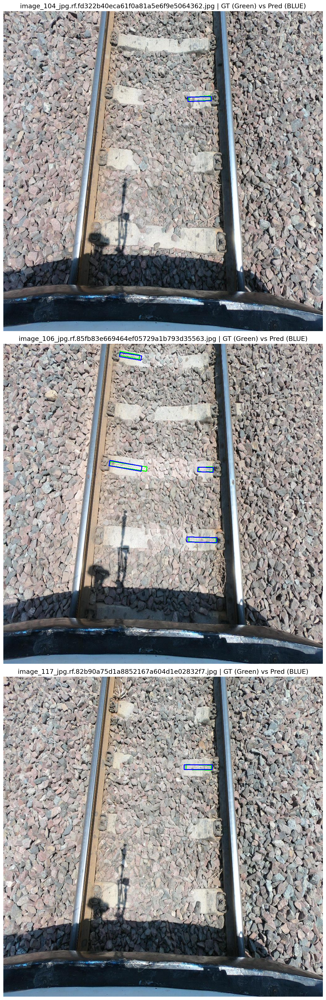

In [ ]:
# Running and Visualizing prediction on the test images
# Initializing the model, test images, test images, labels path
model_path = f"{BASE_PATH}/{PROJECT}/{RUN_NAME}/weights/best.pt"
image_dir = Path(f"{dataset_dir}/test/images")
label_dir = Path(f"{dataset_dir}/test/labels")

# Load model
model = YOLO(model_path)

# Loading the test Images
# .glob() is a method from Python's pathlib library that searches for files matching a pattern inside a directory.
test_images = sorted(image_dir.glob("*.jpg"))
test_images = test_images[:TEST_IMAGES_LENGTH]

# plt.subplots() - It's a Matplotlib function that creates a figure and a grid of subplots (axes) inside it in one call.
# It Always return fig — the overall figure/canvas that contains everything AND axes — the subplot(s) you draw on
# It takes the following parameters number of rows, number of columns, figsize(width, height) in inches, dots per inch
fig, axes = plt.subplots(
    len(test_images), 1,
    figsize=(10, 10 * len(test_images)),
    dpi=150
)

# plt.subplots returns a single object (not a list) when there's only one subplot(1x1). This wraps it in a list so the axes[i] indexing below works consistently.
if len(test_images) == 1:
    axes = [axes]

for i, img_path in enumerate(test_images):
    img = cv2.imread(str(img_path))
    h, w = img.shape[:2]

    # -------- Ground Truth (GREEN) --------
    # The path to the ground truth is the image name with a .txt extension
    label_path = label_dir / f"{img_path.stem}.txt"
    if label_path.exists():
        with open(label_path) as f:
            for line in f:
                # Each line in a YOLO OBB label file is: class x1 y1 x2 y2 x3 y3 x4 y4
                # split() splits the string on whitespace
                # map() -> returns a lazy iterator to convert the string values to float
                # list() -> runs the lazy iterator
                data = list(map(float, line.split()))
                cls = int(data[0])
                coords = data[1:]  # 8 values

                # coords = [x1, y1, x2, y2, x3, y3, x4, y4]
                # points = [[x1,y1], [x2,y2], [x3,y3], [x4,x4]]
                points = np.array(coords).reshape(4, 2)

                # denormalize
                # For all rows multiply the first index with the width
                # For all colums multiply the second index with the height
                points[:, 0] *= w
                points[:, 1] *= h

                # converts the points from float to int
                polygon = points.astype(int)

                # cv2.polylines() -> takes the imgage, polygon points(int) ( 1 x N x 2) , isClosed, Color, Thickness
                cv2.polylines(img, [polygon], True, (0, 255, 0), 2)


    # -------- Predictions (BLUE) --------
    # Predict on the test image, with 0.15 confidence threshold, image size of 1024
    # verbose = False suppresses console output
    results = model.predict(
        source=img_path,
        conf=0.15,
        imgsz=1024,
        verbose=False
    )

    # model.predict() -> returns the list of results object - one per image passed in
    # result.obb contains oriented bounding boxes (your case — OBB model)
    # inside each obb object we have the following
    # obb.xyxyxyxy4 corner points in pixel coords, shape (1, 4, 2)
    # obb.xywhrcenter x, y, width, height, rotation angle
    # obb.confconfidence score e.g. 0.87
    # obb.clsclass ID e.g. 0.0
    # YOLO runs inference on the GPU for speed. The result tensor lives in GPU memory, which numpy and OpenCV cannot access directly.
    # .cpu() moves the tensor from GPU memory to regular CPU/RAM.
    # Even on CPU, it's still a PyTorch tensor — not a numpy array. OpenCV only works with numpy arrays, so this converts it.
    # poly is a 1x8 which gets reshaped to 4x2 then to (1x4x2)
    for obb in results[0].obb:
        poly = obb.xyxyxyxy[0].cpu().numpy().astype(int)
        cv2.polylines(img, [poly.reshape(-1, 2)], True, (255, 0, 0), 2)

    # Show
    # cv by default reads the image as BGR
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axes[i].imshow(img_rgb)
    axes[i].axis("off")
    axes[i].set_title(
        f"{img_path.name} | GT (Green) vs Pred (BLUE)",
        fontsize=14
    )

plt.tight_layout() # It automatically adjusts the spacing between subplots so they don't overlap or get clipped.
plt.show()

In [ ]:
# Load the best trained model again
best_model_path = f"{BASE_PATH}/{PROJECT}/{RUN_NAME}/weights/best.pt"
model = YOLO(best_model_path)

# Run validation on the dataset to get the metrics
# It runs your trained model against the validation (or test) dataset and computes evaluation metrics — telling you objectively how well the model performs.
# takes the data.yml path, image size, confidence threshold, split to test on ( 'test', 'val' )
val_results = model.val(data=os.path.join(dataset_dir, "data.yaml"))

print("Validation Metrics:")
print(f"  mAP50: {val_results.box.map50:.3f}")
print(f"  mAP50-95: {val_results.box.map:.3f}")
print(f"  Precision: {val_results.box.p[0]:.3f}")
print(f"  Recall: {val_results.box.r[0]:.3f}")

Ultralytics 8.4.21 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLOv8n-obb summary (fused): 82 layers, 3,077,414 parameters, 0 gradients, 8.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3045.0±418.1 MB/s, size: 300.8 KB)
val: Scanning /content/BTP-1/valid/labels.cache... 63 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 63/63 14.7Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 1.4s/it 5.5s
                   all         63        178      0.924      0.884      0.921      0.637
Speed: 22.4ms preprocess, 12.8ms inference, 0.0ms loss, 8.0ms postprocess per image
Results saved to /content/runs/obb/val
Validation Metrics:
  mAP50: 0.921
  mAP50-95: 0.637
  Precision: 0.924
  Recall: 0.884


In [ ]:
run = wandb.init(project=WANDB_PROJECT_NAME, id=RUN_ID, resume="must")

# This is what appears in the runs comparison table
run.summary.update({
    "val/mAP50"     : val_results.box.map50,
    "val/mAP50_95"  : val_results.box.map,
    "val/precision" : val_results.box.p[0],
    "val/recall"    : val_results.box.r[0],
})

wandb.finish()